# Module 4. Spatial relations
# Spatial joins

## Lecture objectives

1. Provide more practice with wrangling different datasets and regular joins
2. Explain more uses of `groupby`
3. Demonstrate how to do spatial joins in `geopandas`

Let's think about joins in a spatial setting. Let's grab the [California food pantry dataset](https://controllerdata.lacity.org/dataset/Food-Resources-in-California/v2mg-qsxf) and join it to the census data. The aim: analyze the demographics of neighborhoods with food pantries.

In [2]:
from IPython.display import display

import geopandas as gpd
import numpy as np
import pandas as pd
pantryDf = pd.read_csv('../data/Food_Resources_in_California.csv')
display(pantryDf.head())
print(pantryDf.columns)

,Name,Street Address,City,State,Zip Code,County,Phone,Description,Resource Type,Web Link,Notes,Latitude,Longitude
0,Agnes Memorial Church Of God In Christ,2372 International Boulevard,Oakland,CA,94601,Alameda,510-533-1101,Partners with the City of Oakland's Hunger Rel...,Food Pantry,http://agnesmemorialchurch.com,NaN,37.783047,-122.234238
1,Alameda County Community Food Bank,7900 Edgewater Drive,Oakland,CA,94621,Alameda,510-635-3663,Call our Helpline at: 1-800-870-FOOD (3663) or...,Food Bank,https://www.accfb.org/,NaN,37.741538,-122.201300
2,Salaam Food Pantry,4039 Irvington Avenue,Fremont,CA,94538,Alameda,415-860-2409,Provides non-perishable grocery bags for needy...,Food Pantry,http://salaamfoodpantry.org/,NaN,37.531391,-121.959689
3,Sierra Winds,10354 Argonaut Lane,Jackson,CA,95642,Amador,NaN,"Monday through Friday Lunch at Noon, (must att...",Food Pantry,http://www.feedamador.org/site/pages/get_help.cgi,NaN,38.358841,-120.789164
4,St Patrick's Hall,115 Court St,Jackson,CA,95642,Amador,NaN,"Thursday evenings, 5:00-7:00pm",Food Pantry,http://www.feedamador.org/site/pages/get_help.cgi,NaN,38.349870,-120.773385


Index(['Name', 'Street Address', 'City', 'State', 'Zip Code', 'County',
       'Phone', 'Description', 'Resource Type', 'Web Link', 'Notes',
       'Latitude', 'Longitude'],
      dtype='object')


It's a statewide dataset, but to keep things simple, let's limit to the county of Los Angeles.

In [3]:
pantryDf = pantryDf[pantryDf.County=='Los Angeles']

<div class="alert alert-block alert-info">
<strong>Exercise:</strong> Examine the columns of the dataframe. Which ones contain spatial information?
</div>

While this is a regular csv file, there is spatial information in the `Latitude` and `Longitude` fields. The `gpd.points_from_xy()` function is ideal for creating geometries from these fields.

The geopandas documentation is fairly helpful. Note that while the `crs` argument (i.e., the projection) is optional, it's good practice to specify it.

In [4]:
help(gpd.points_from_xy)

Help on function points_from_xy in module geopandas.array:

points_from_xy(x, y, z=None, crs=None)
    Generate GeometryArray of shapely Point geometries from x, y(, z) coordinates.
    
    In case of geographic coordinates, it is assumed that longitude is captured by
    ``x`` coordinates and latitude by ``y``.
    
    Parameters
    ----------
    x, y, z : iterable
    crs : value, optional
        Coordinate Reference System of the geometry objects. Can be anything accepted by
        :meth:`pyproj.CRS.from_user_input() <pyproj.crs.CRS.from_user_input>`,
        such as an authority string (eg "EPSG:4326") or a WKT string.
    
    Examples
    --------
    >>> import pandas as pd
    >>> df = pd.DataFrame({'x': [0, 1, 2], 'y': [0, 1, 2], 'z': [0, 1, 2]})
    >>> df
       x  y  z
    0  0  0  0
    1  1  1  1
    2  2  2  2
    >>> geometry = geopandas.points_from_xy(x=[1, 0], y=[0, 1])
    >>> geometry = geopandas.points_from_xy(df['x'], df['y'], df['z'])
    >>> gdf = geopanda

Let's do this and turn `pantryDf` into a new GeoDataFrame, called `pantrygdf`. Notice that a new column called `geometry` is added.

In [5]:
pantrygdf = gpd.GeoDataFrame(
    pantryDf, geometry=gpd.points_from_xy(pantryDf.Longitude, pantryDf.Latitude, 
                                          crs='EPSG:4326'))
pantrygdf.head()

,Name,Street Address,City,State,Zip Code,County,Phone,Description,Resource Type,Web Link,Notes,Latitude,Longitude,geometry
315,Aids Project Los Angeles - Vance North Necessi...,3935 E. 10th St.,Long Beach,CA,90813,Los Angeles,(213) 201-1326,The program provides emergency food services a...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,33.779225,-118.146143,POINT (-118.14614 33.77922)
329,Aaron Community Cultural Center,1010-B W. 108th St.,Los Angeles,CA,90044,Los Angeles,(800) 527-4184,The agency provides employment services and sh...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,33.938011,-118.292446,POINT (-118.29245 33.93801)
330,Action Food Pantry,17880 E. Covina Blvd.,Covina,CA,91722,Los Angeles,(626) 319-0554,The organization provides emergency food for p...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.099089,-117.900356,POINT (-117.90036 34.09909)
331,"Aids Food Store , The",3935 E. 10th St.,Long Beach,CA,90804,Los Angeles,(562) 434-3425,The agency provides emergency food to people w...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,33.779225,-118.146143,POINT (-118.14614 33.77922)
332,Aids Project Los Angeles - Vance North Necessi...,611 S. Kingsley Dr.,Los Angeles,CA,90005,Los Angeles,(213) 201-1433,The program provides emergency food services a...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.062950,-118.303030,POINT (-118.30303 34.06295)


We can double check that the `crs` is to our satisfaction.

In [6]:
pantrygdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Now let's map it. The basemaps are in Web Mercator projection by default, so we need to transform our data to that projection (`3857`). 

[]

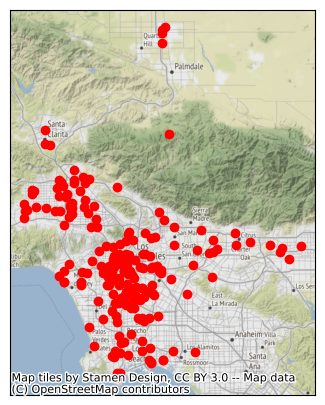

In [7]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create blank figure and axis objects
fig, ax = plt.subplots(figsize=(5,5))
# Plot the data. ax=ax means we plot it on the axes that we just created
pantrygdf.to_crs('EPSG:3857').plot(color='r', ax=ax) 

# Let's add a basemap using the contextily library
# Note that we add it to the same axes object. 
# The zoom level is trial and error
ctx.add_basemap(ax, zoom=10)

# and we really don't need the axis ticks and labels, so we set them to an empty list
ax.set_xticks([])
ax.set_yticks([])

<div class="alert alert-block alert-info">
    <strong>Exercise:</strong> What happens if you remove the <strong>to_crs</strong> part of the code? How can you explain what's going on?
</div>

### Merging with census and EnviroScreen data
The map is nice if we just want to look at the locations. But we can't do any analysis of how food pantry locations correlate with neighborhood characteristics.

To do that, let's load in our other data sources. First, we'll use `cenpy` to get the Census data.

In [8]:
# get the census tract level data
# this should be familiar to you from previous lectures
from cenpy import products
incomeDf = products.ACS(2017).from_county('Los Angeles, CA', level='tract',
                                        variables='B19019_001E')
incomeDf.rename(columns={'B19019_001E':'median_HH_income'}, inplace=True)
incomeDf.head()

/Users/chaithra/opt/anaconda3/envs/uds/lib/python3.10/site-packages/cenpy/products.py:762: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  return self._from_name(county, variables, level, "Counties", **kwargs)


,GEOID,geometry,median_HH_income,NAME,state,county,tract
0,06037670324,"POLYGON ((-13181622.320 4001604.410, -13181397...",207679.0,"Census Tract 6703.24, Los Angeles County, Cali...",06,037,670324
1,06037670500,"POLYGON ((-13176441.290 3996934.430, -13176429...",206932.0,"Census Tract 6705, Los Angeles County, California",06,037,670500
2,06037651101,"POLYGON ((-13174776.060 4002986.790, -13174774...",93160.0,"Census Tract 6511.01, Los Angeles County, Cali...",06,037,651101
3,06037297400,"POLYGON ((-13172981.590 3990813.920, -13172775...",91164.0,"Census Tract 2974, Los Angeles County, California",06,037,297400
4,06037670100,"POLYGON ((-13172288.180 4000326.940, -13172287...",58340.0,"Census Tract 6701, Los Angeles County, California",06,037,670100


Let's also add [EnviroScreen](https://oehha.ca.gov/calenviroscreen/maps-data/download-data) – a composite dataset focusing on environmental justice. CARB doesn't have an API, but we can download and load it.

I included the downloaded shapefile version in our class git repository. (That ensures that we are working off the same version.)

We used `gpd.read_file()` before to get a GeoJSON from the Socrata API. You can also use it to load in a file from disk.

In [9]:
enviroscreenDf = gpd.read_file('../data/CalEnviroScreen/CES4 Final Shapefile.shp')
enviroscreenDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,12.5028,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.070 -341919.191, -38126.384 -..."
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,5.3519,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.070 -341919.191, -39803.632 -..."
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,12.8857,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -..."
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,14.4128,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -..."
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,18.8872,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -..."


First, we'll do a tabular join, in the same way as the last lecture.

It looks like both datasets have the census tract. It's called `GEOID` in the census data, and `Tract` in the EnviroScreen data. So we should be able to use the pandas `.join()` to join them together.

The census data is for LA County. The EnviroScreen data is for all of California. So let's do a left join from the census data, `incomeDf`, so that we only keep the LA County census tracts.

In [10]:
# First, let's make the census tract the index, so that we can join on the index.
incomeDf.set_index('GEOID', inplace=True)
enviroscreenDf.set_index('Tract', inplace=True)

In [11]:
joinedDf = incomeDf.join(enviroscreenDf) # left join by default

ValueError: columns overlap but no suffix specified: Index(['geometry'], dtype='object')

We get our first error. The columns overlap. Remember how to do this? We could just drop that column (which we'll do here), or use the `rsuffix` argument (as we did in the last lecture).

In [12]:
joinedDf = incomeDf.join(enviroscreenDf.drop(columns='geometry')) 
joinedDf.head()

,geometry,median_HH_income,NAME,state,county,tract,ZIP,County,ApproxLoc,TotPop19,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
GEOID,,,,,,,,,,,,,,,,,,,,,
06037670324,"POLYGON ((-13181622.320 4001604.410, -13181397...",207679.0,"Census Tract 6703.24, Los Angeles County, Cali...",06,037,670324,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037670500,"POLYGON ((-13176441.290 3996934.430, -13176429...",206932.0,"Census Tract 6705, Los Angeles County, California",06,037,670500,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037651101,"POLYGON ((-13174776.060 4002986.790, -13174774...",93160.0,"Census Tract 6511.01, Los Angeles County, Cali...",06,037,651101,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037297400,"POLYGON ((-13172981.590 3990813.920, -13172775...",91164.0,"Census Tract 2974, Los Angeles County, California",06,037,297400,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037670100,"POLYGON ((-13172288.180 4000326.940, -13172287...",58340.0,"Census Tract 6701, Los Angeles County, California",06,037,670100,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


What went wrong? All the values from EnviroScreen are `NaN`.

Looking at the lengths of dataframes (i.e., number of rows) is a good place to start when troubleshooting joins.

In [13]:
print('incomeDf length: {}'.format(len(incomeDf)))
print('enviroscreenDf length: {}'.format(len(enviroscreenDf)))
print('joinedDf length: {}'.format(len(joinedDf)))

incomeDf length: 2346
enviroscreenDf length: 8035
joinedDf length: 2346


This looks OK. We wanted a left, 1:1 join, and we got the same number of rows in the joined dataframe as in the LA-only dataset.

`describe()` is another helpful function.

In [14]:
joinedDf.describe()

,median_HH_income,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,DieselPM,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
count,2307.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,66213.016472,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,32487.553195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,5682.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,41795.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,59444.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,82125.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,250001.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Our join was a total failure! We have no rows joined from `enviroscreenDf`.

<div class="alert alert-block alert-info">
<strong>Exercise:</strong> How might you troubleshoot the problem? What steps would you take?
</div>

What about looking at the join columns?

In [15]:
print(incomeDf.index)
print(enviroscreenDf.index)

Index(['06037670324', '06037670500', '06037651101', '06037297400',
       '06037670100', '06037293306', '06037297202', '06037296901',
       '06037297120', '06037980015',
       ...
       '06037401102', '06037403702', '06037403304', '06037403303',
       '06037403703', '06037400304', '06037402405', '06037400302',
       '06037401704', '06037402801'],
      dtype='object', name='GEOID', length=2346)
Index([6083002103.0, 6083002402.0, 6083002102.0, 6083002010.0, 6083002009.0,
       6083002008.0, 6083002007.0, 6011000500.0, 6011000200.0, 6011000400.0,
       ...
       6037183510.0, 6037183610.0, 6037183520.0, 6037183810.0, 6037400602.0,
       6037430302.0, 6037430723.0, 6037431100.0, 6037533603.0, 6037534101.0],
      dtype='float64', name='Tract', length=8035)


Aha. We are trying to join a string representation of the census tract FIPS codes with a numeric (floating point) representation. 

Also note that the numeric version is missing the leading zero.

Let's convert the numeric version to a string, and use the `.zfill()` function to add the leading zero. For example, `.zfill(11)` will add zeros until the string is length 11.

Let's drop the index (put it back as a regular column), as it's easier to apply functions in pandas to regular columns.

In [16]:
enviroscreenDf.reset_index(inplace=True) # get Tract back to a regular column

enviroscreenDf['GEOID'] = enviroscreenDf.Tract.astype(str).str.zfill(11)
enviroscreenDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,GEOID
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.070 -341919.191, -38126.384 -...",6083002103.0
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.070 -341919.191, -39803.632 -...",6083002402.0
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -...",6083002102.0
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -...",6083002010.0
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -...",6083002009.0


Still not there! We captured the decimal point as well. 

Let's convert to an integer and then to a string.

In [17]:
# we use np.int64 rather than int because, on Windows, the default is a 32-bit integer
# that is too small for the GEOID. More on integers in Module 10
enviroscreenDf['GEOID'] = enviroscreenDf.Tract.astype(np.int64).astype(str).str.zfill(11)
enviroscreenDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,GEOID
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.070 -341919.191, -38126.384 -...",06083002103
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.070 -341919.191, -39803.632 -...",06083002402
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -...",06083002102
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -...",06083002010
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -...",06083002009


Looks good. Let's try the join again. Remember, `GEOID` is already the index on `incomeDf`, so we don't need to set the index again.

In [18]:
enviroscreenDf.set_index('GEOID', inplace=True)
joinedDf = incomeDf.join(enviroscreenDf.drop(columns='geometry')) 
joinedDf.head()

,geometry,median_HH_income,NAME,state,county,tract,Tract,ZIP,County,ApproxLoc,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
GEOID,,,,,,,,,,,,,,,,,,,,,
06037670324,"POLYGON ((-13181622.320 4001604.410, -13181397...",207679.0,"Census Tract 6703.24, Los Angeles County, Cali...",06,037,670324,6.037670e+09,90274.0,Los Angeles,Palos Verdes Estates,...,63.7792,25.1228,7.7784,74.1701,0.5696,0.0000,2.8874,14083.141738,4.847673e+06,14.5944
06037670500,"POLYGON ((-13176441.290 3996934.430, -13176429...",206932.0,"Census Tract 6705, Los Angeles County, California",06,037,670500,6.037670e+09,90274.0,Los Angeles,Rolling Hills,...,62.2604,32.9147,5.8163,71.3153,1.4541,0.0000,5.8163,14564.860670,7.746939e+06,15.5981
06037651101,"POLYGON ((-13174776.060 4002986.790, -13174774...",93160.0,"Census Tract 6511.01, Los Angeles County, Cali...",06,037,651101,6.037651e+09,90505.0,Los Angeles,Torrance,...,65.7665,21.4853,7.4464,37.4702,0.9333,2.2041,2.9388,11444.688665,5.576738e+06,49.0071
06037297400,"POLYGON ((-13172981.590 3990813.920, -13172775...",91164.0,"Census Tract 2974, Los Angeles County, California",06,037,297400,6.037297e+09,90732.0,Los Angeles,Los Angeles,...,62.4255,33.5221,22.8844,67.2825,2.4136,0.0000,2.3540,6575.837414,2.247463e+06,5.0656
06037670100,"POLYGON ((-13172288.180 4000326.940, -13172287...",58340.0,"Census Tract 6701, Los Angeles County, California",06,037,670100,6.037670e+09,90717.0,Los Angeles,Lomita,...,64.1524,19.9639,30.3824,36.9768,9.7561,0.0000,7.1966,7576.848536,1.448977e+06,15.6880


Looks promising! Let's double check we have the right number of rows, and describe the results.

In [19]:
print('incomeDf length: {}'.format(len(incomeDf)))
print('enviroscreenDf length: {}'.format(len(enviroscreenDf)))
print('joinedDf length: {}'.format(len(joinedDf)))
joinedDf.describe()

incomeDf length: 2346
enviroscreenDf length: 8035
joinedDf length: 2346


,median_HH_income,Tract,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
count,2307.000000,2.342000e+03,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,...,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2.342000e+03,2342.000000
mean,66213.016472,6.037407e+09,90853.771990,4302.520495,17.621485,45.328830,0.051684,59.743564,11.655254,71.232949,...,67.340218,6.685418,40.831372,19.908004,0.810777,-6.534408,-4.222465,6574.527345,4.531046e+06,0.748994
std,32487.553195,2.272894e+05,813.582188,1580.865757,144.902819,150.117013,0.008183,23.265025,0.987341,16.481635,...,88.670036,83.683462,90.900274,88.167038,83.790941,82.384319,82.556652,10369.001353,3.422030e+07,166.556387
min,5682.000000,6.037101e+09,90001.000000,0.000000,-999.000000,-999.000000,0.038092,16.776602,5.789804,2.663348,...,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,1159.518702,7.045248e+04,-1998.000000
25%,41795.000000,6.037212e+09,90064.000000,3210.750000,23.669576,45.792360,0.044902,39.987554,11.622512,63.774113,...,71.572275,9.079350,20.546125,4.820500,1.115350,0.000000,0.725575,3393.358649,5.967105e+05,3.483875
50%,59444.000000,6.037405e+09,90717.000000,4213.000000,37.643651,71.551941,0.049788,60.659614,11.906337,73.391413,...,74.828050,12.717050,45.467950,16.601450,3.472350,0.000000,2.078500,4596.240130,1.021093e+06,9.621500
75%,82125.000000,6.037553e+09,91364.000000,5316.250000,50.938254,88.789082,0.059387,79.987554,12.074029,82.806472,...,77.739475,16.842850,72.975625,46.913500,8.192900,0.209125,3.913925,6378.699170,1.838643e+06,18.437975
max,250001.000000,6.037980e+09,93591.000000,12463.000000,82.393909,99.974786,0.068592,97.598009,14.603416,98.630989,...,100.000000,100.000000,100.000000,91.950100,84.708200,100.000000,14.801000,190140.280923,1.032967e+09,87.550200


### The spatial join

So far, our join has been non-spatial, using the tract FIPS identifier.

But how do we join the food pantry data with the merged census/EnviroScreen - the `joinedDf` that we just created? 

The food pantry dataset doesn't have any geographic identifiers like census tract, just the point location.

The income/EnviroScreen data are at census tract level, so presumably we need to identify which census tract a pantry is in. Fortunately, the census data gave us the polygons of the tract boundaries (the `geometry` column).

Let's do a **spatial join**. In `geopandas`, that's accomplished using the `sjoin()` function.

The same types of join (inner, left, right, outer) apply. And you might get a 1:1 join or a 1:many join. But we can see in the documentation that the default join type is inner, not left (unlike pandas).

With spatial joins, we also have to specify the spatial relationship. We'll start with the most common - intersects, which means that the two geometries touch or overlap. We'll look at other relationships in the next lecture. If you are familiar with QGIS or ArcGIS, the terminology is the same.


In [20]:
help(gpd.sjoin)

Help on function sjoin in module geopandas.tools.sjoin:

sjoin(left_df, right_df, how='inner', predicate='intersects', lsuffix='left', rsuffix='right', **kwargs)
    Spatial join of two GeoDataFrames.
    
    See the User Guide page :doc:`../../user_guide/mergingdata` for details.
    
    
    Parameters
    ----------
    left_df, right_df : GeoDataFrames
    how : string, default 'inner'
        The type of join:
    
        * 'left': use keys from left_df; retain only left_df geometry column
        * 'right': use keys from right_df; retain only right_df geometry column
        * 'inner': use intersection of keys from both dfs; retain only
          left_df geometry column
    predicate : string, default 'intersects'
        Binary predicate. Valid values are determined by the spatial index used.
        You can check the valid values in left_df or right_df as
        ``left_df.sindex.valid_query_predicates`` or
        ``right_df.sindex.valid_query_predicates``
        Replaces 

In [21]:
pantries_sjoin = gpd.sjoin(joinedDf, pantrygdf, predicate='intersects')
pantries_sjoin.head()

/var/folders/cx/5hr478816plb9gd8v3v207d40000gn/T/ipykernel_6651/1961094822.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3857
Right CRS: EPSG:4326

  pantries_sjoin = gpd.sjoin(joinedDf, pantrygdf, predicate='intersects')


,geometry,median_HH_income,NAME,state,county,tract,Tract,ZIP,County_left,ApproxLoc,...,State,Zip Code,County_right,Phone,Description,Resource Type,Web Link,Notes,Latitude,Longitude
GEOID,,,,,,,,,,,,,,,,,,,,,


We should get a warning message there. To do a spatial join, the dataframes have to be in the same projection (coordinate reference system).

If we are measuring distances, the projection matters! For example, you typically want to measure distances in meters or feet, not degrees. For intersections, they just have to be the same.

In [22]:
print(incomeDf.crs)
print(pantrygdf.crs)

epsg:3857
EPSG:4326


It doesn't matter which one we choose. Let's reproject `pantrygdf`. 

In [23]:
pantries_sjoin = gpd.sjoin(joinedDf, pantrygdf.to_crs('EPSG:3857'), predicate='intersects')
pantries_sjoin.head()

,geometry,median_HH_income,NAME,state,county,tract,Tract,ZIP,County_left,ApproxLoc,...,State,Zip Code,County_right,Phone,Description,Resource Type,Web Link,Notes,Latitude,Longitude
GEOID,,,,,,,,,,,,,,,,,,,,,
06037670100,"POLYGON ((-13172288.180 4000326.940, -13172287...",58340.0,"Census Tract 6701, Los Angeles County, California",06,037,670100,6.037670e+09,90717.0,Los Angeles,Lomita,...,CA,90717,Los Angeles,(310) 326-4541,The agency provides emergency food for low-inc...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,33.787858,-118.309293
06037296901,"POLYGON ((-13169228.570 3992447.710, -13169228...",42500.0,"Census Tract 2969.01, Los Angeles County, Cali...",06,037,296901,6.037297e+09,90731.0,Los Angeles,Los Angeles,...,CA,90731,Los Angeles,NaN,LOCAL DISTRICT SOUTH,Food Distribution Program,http://danams-lausd-ca.schoolloop.com/,NaN,33.730520,-118.294720
06037141400,"POLYGON ((-13189537.140 4050957.410, -13189536...",94279.0,"Census Tract 1414, Los Angeles County, California",06,037,141400,6.037141e+09,91436.0,Los Angeles,Los Angeles,...,CA,91436,Los Angeles,(818) 788-6000,The agency provides emergency food for people ...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.155634,-118.476537
06037127210,"POLYGON ((-13187597.510 4057602.400, -13187588...",46842.0,"Census Tract 1272.10, Los Angeles County, Cali...",06,037,127210,6.037127e+09,91405.0,Los Angeles,Los Angeles,...,CA,91405,Los Angeles,NaN,LOCAL DISTRICT NORTHEAST,Food Distribution Program,https://fulton-lausd-ca.schoolloop.com/,NaN,34.206393,-118.457635
06037127210,"POLYGON ((-13187597.510 4057602.400, -13187588...",46842.0,"Census Tract 1272.10, Los Angeles County, Cali...",06,037,127210,6.037127e+09,91405.0,Los Angeles,Los Angeles,...,CA,91405,Los Angeles,(818) 781-4156,The agency provides emergency food for individ...,Food Pantry,https://www.211la.org/211search/more?site_id=1...,NaN,34.210903,-118.457332


Looks good. Let's do our post-join checks again.

In [24]:
print('pantrygdf length: {}'.format(len(pantrygdf)))
print('joinedDf length: {}'.format(len(joinedDf)))
print('pantries_sjoin length: {}'.format(len(pantries_sjoin)))
joinedDf.describe()

pantrygdf length: 211
joinedDf length: 2346
pantries_sjoin length: 209


,median_HH_income,Tract,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
count,2307.000000,2.342000e+03,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,...,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2342.000000,2.342000e+03,2342.000000
mean,66213.016472,6.037407e+09,90853.771990,4302.520495,17.621485,45.328830,0.051684,59.743564,11.655254,71.232949,...,67.340218,6.685418,40.831372,19.908004,0.810777,-6.534408,-4.222465,6574.527345,4.531046e+06,0.748994
std,32487.553195,2.272894e+05,813.582188,1580.865757,144.902819,150.117013,0.008183,23.265025,0.987341,16.481635,...,88.670036,83.683462,90.900274,88.167038,83.790941,82.384319,82.556652,10369.001353,3.422030e+07,166.556387
min,5682.000000,6.037101e+09,90001.000000,0.000000,-999.000000,-999.000000,0.038092,16.776602,5.789804,2.663348,...,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,1159.518702,7.045248e+04,-1998.000000
25%,41795.000000,6.037212e+09,90064.000000,3210.750000,23.669576,45.792360,0.044902,39.987554,11.622512,63.774113,...,71.572275,9.079350,20.546125,4.820500,1.115350,0.000000,0.725575,3393.358649,5.967105e+05,3.483875
50%,59444.000000,6.037405e+09,90717.000000,4213.000000,37.643651,71.551941,0.049788,60.659614,11.906337,73.391413,...,74.828050,12.717050,45.467950,16.601450,3.472350,0.000000,2.078500,4596.240130,1.021093e+06,9.621500
75%,82125.000000,6.037553e+09,91364.000000,5316.250000,50.938254,88.789082,0.059387,79.987554,12.074029,82.806472,...,77.739475,16.842850,72.975625,46.913500,8.192900,0.209125,3.913925,6378.699170,1.838643e+06,18.437975
max,250001.000000,6.037980e+09,93591.000000,12463.000000,82.393909,99.974786,0.068592,97.598009,14.603416,98.630989,...,100.000000,100.000000,100.000000,91.950100,84.708200,100.000000,14.801000,190140.280923,1.032967e+09,87.550200


Now, we get many more rows. Why? Perhaps some census tracts have more than one pantry - a 1:many join.

A quick way to look at this is the `groupby` function we saw in the previous lecture. Rather than asking for the sum or the mean, we can ask for the sizes of each group.

In [25]:
pantrycounts = pantries_sjoin.groupby(level=0).size()
pantrycounts

GEOID
06037101110    1
06037104103    1
06037104108    1
06037104201    1
06037104822    1
              ..
06037910811    1
06037920115    1
06037920312    1
06037920336    1
06037980008    1
Length: 190, dtype: int64

And get some summary statistics.

In [26]:
pantrycounts.describe()

count    190.000000
mean       1.100000
std        0.317897
min        1.000000
25%        1.000000
50%        1.000000
75%        1.000000
max        3.000000
dtype: float64

We see that a census tract has up to three pantries. What about the minimum? That's harder to decipher, as we did an inner join that dropped census tracts without pantries. Thus, the minimum is 1, not zero.

But we still care if a census tract has no pantry at all. The easiest way to fix this is to join the number of pantries `pantrycounts` (which we just created) back to our `joinedDf` with the EnviroScreen and census data. If we do a left join, we'll keep all the census tracts - even those that don't have pantries!

We saw above that `pantrycounts` is indexed by `GEOID`. So is `joinedDf`. So we can join on the index. One quirk is that we need to make sure the pandas Series has a name before joining.

In [27]:
pantrycounts.name = 'n_pantries'

# look at the length before
print(len(joinedDf))

joinedDf = joinedDf.join(pantrycounts)

# look at the length after the join
print(len(joinedDf))
joinedDf.head()

2346
2346


,geometry,median_HH_income,NAME,state,county,tract,Tract,ZIP,County,ApproxLoc,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,n_pantries
GEOID,,,,,,,,,,,,,,,,,,,,,
06037670324,"POLYGON ((-13181622.320 4001604.410, -13181397...",207679.0,"Census Tract 6703.24, Los Angeles County, Cali...",06,037,670324,6.037670e+09,90274.0,Los Angeles,Palos Verdes Estates,...,25.1228,7.7784,74.1701,0.5696,0.0000,2.8874,14083.141738,4.847673e+06,14.5944,NaN
06037670500,"POLYGON ((-13176441.290 3996934.430, -13176429...",206932.0,"Census Tract 6705, Los Angeles County, California",06,037,670500,6.037670e+09,90274.0,Los Angeles,Rolling Hills,...,32.9147,5.8163,71.3153,1.4541,0.0000,5.8163,14564.860670,7.746939e+06,15.5981,NaN
06037651101,"POLYGON ((-13174776.060 4002986.790, -13174774...",93160.0,"Census Tract 6511.01, Los Angeles County, Cali...",06,037,651101,6.037651e+09,90505.0,Los Angeles,Torrance,...,21.4853,7.4464,37.4702,0.9333,2.2041,2.9388,11444.688665,5.576738e+06,49.0071,NaN
06037297400,"POLYGON ((-13172981.590 3990813.920, -13172775...",91164.0,"Census Tract 2974, Los Angeles County, California",06,037,297400,6.037297e+09,90732.0,Los Angeles,Los Angeles,...,33.5221,22.8844,67.2825,2.4136,0.0000,2.3540,6575.837414,2.247463e+06,5.0656,NaN
06037670100,"POLYGON ((-13172288.180 4000326.940, -13172287...",58340.0,"Census Tract 6701, Los Angeles County, California",06,037,670100,6.037670e+09,90717.0,Los Angeles,Lomita,...,19.9639,30.3824,36.9768,9.7561,0.0000,7.1966,7576.848536,1.448977e+06,15.6880,1.0


Looks good. We just need to replace the `NaN` values with zeros.

In [28]:
joinedDf.n_pantries.fillna(0,inplace=True)
joinedDf.head()

,geometry,median_HH_income,NAME,state,county,tract,Tract,ZIP,County,ApproxLoc,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,n_pantries
GEOID,,,,,,,,,,,,,,,,,,,,,
06037670324,"POLYGON ((-13181622.320 4001604.410, -13181397...",207679.0,"Census Tract 6703.24, Los Angeles County, Cali...",06,037,670324,6.037670e+09,90274.0,Los Angeles,Palos Verdes Estates,...,25.1228,7.7784,74.1701,0.5696,0.0000,2.8874,14083.141738,4.847673e+06,14.5944,0.0
06037670500,"POLYGON ((-13176441.290 3996934.430, -13176429...",206932.0,"Census Tract 6705, Los Angeles County, California",06,037,670500,6.037670e+09,90274.0,Los Angeles,Rolling Hills,...,32.9147,5.8163,71.3153,1.4541,0.0000,5.8163,14564.860670,7.746939e+06,15.5981,0.0
06037651101,"POLYGON ((-13174776.060 4002986.790, -13174774...",93160.0,"Census Tract 6511.01, Los Angeles County, Cali...",06,037,651101,6.037651e+09,90505.0,Los Angeles,Torrance,...,21.4853,7.4464,37.4702,0.9333,2.2041,2.9388,11444.688665,5.576738e+06,49.0071,0.0
06037297400,"POLYGON ((-13172981.590 3990813.920, -13172775...",91164.0,"Census Tract 2974, Los Angeles County, California",06,037,297400,6.037297e+09,90732.0,Los Angeles,Los Angeles,...,33.5221,22.8844,67.2825,2.4136,0.0000,2.3540,6575.837414,2.247463e+06,5.0656,0.0
06037670100,"POLYGON ((-13172288.180 4000326.940, -13172287...",58340.0,"Census Tract 6701, Los Angeles County, California",06,037,670100,6.037670e+09,90717.0,Los Angeles,Lomita,...,19.9639,30.3824,36.9768,9.7561,0.0000,7.1966,7576.848536,1.448977e+06,15.6880,1.0


Let's plot the number of pantries against income.

<Axes: xlabel='median_HH_income', ylabel='n_pantries'>

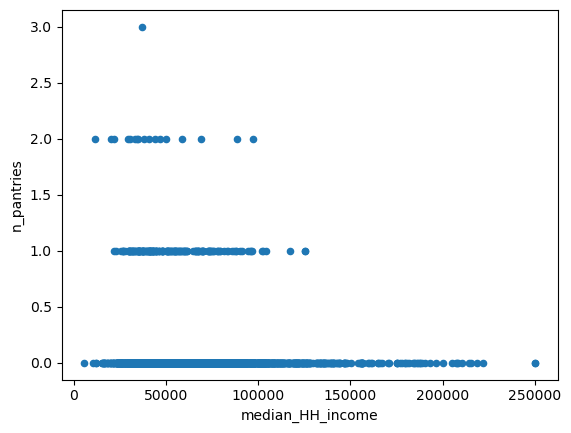

In [29]:
joinedDf.plot.scatter('median_HH_income', 'n_pantries')

Looks like there is a relationship. It would be nice to add a best fit line. `seaborn` is a library that is built on `matplotlib`, but generally makes prettier plots and has more statistical functions.

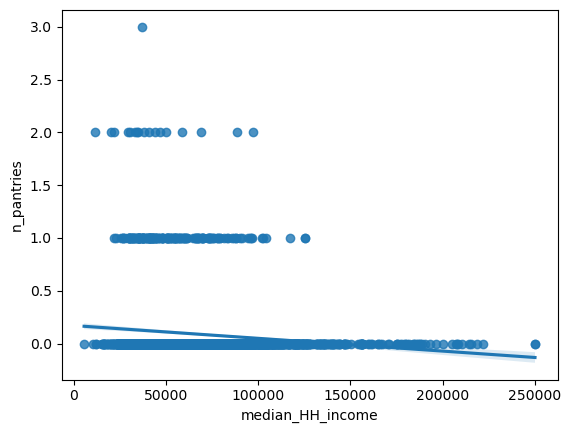

In [30]:
import seaborn as sns
ax = sns.regplot(x="median_HH_income", y="n_pantries", data=joinedDf)

It looks like there is a very shallow slope. How you intepret that (need vs exclusion) is a question we can't answer with these data!

Before moving on, we can also answer the reverse question: what are the characteristics of census tracts that have no food pantries, one pantry, etc.

This is a task (again) for `groupby`. 

In [31]:
joinedDf.groupby('n_pantries').median_HH_income.mean()

n_pantries
0.0    67398.298536
1.0    53983.575581
2.0    44074.176471
3.0    36795.000000
Name: median_HH_income, dtype: float64

This looks like it would make a nice bar chart.

Text(0.5, 0, 'Number of pantries per census tract')

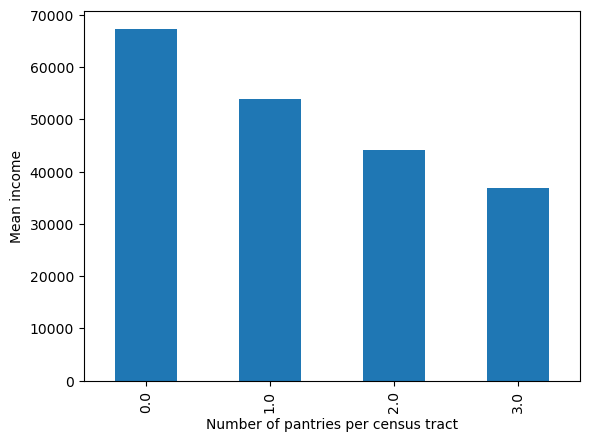

In [32]:
fig, ax = plt.subplots()
joinedDf.groupby('n_pantries').median_HH_income.mean().plot(kind='bar', ax=ax)
ax.set_ylabel('Mean income')
ax.set_xlabel('Number of pantries per census tract')

## Recap
We did a lot of join operations. Let's recap to see what we did.

<div class="alert alert-block alert-info">
<strong>Exercise:</strong> Go step-by-step through the previous code. At each step, identify which datasets you are joining, and how (left, right, outer, inner join? On which column or spatial relationship?)
</div>

First, we joined the census data to the EnviroScreen data using `GEOID`.

<div>
   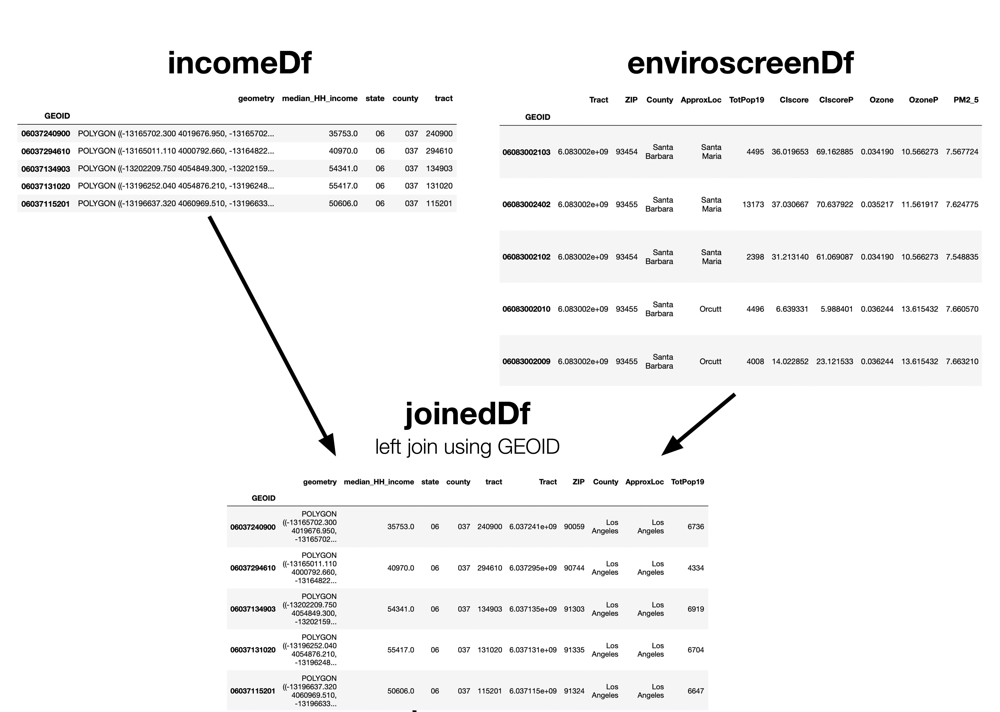
</div>

Then we did a spatial join to the pantry data.

<div>
   
</div>

Then we used `groupby` to get counts of pantries by census tract.

<div>
   
</div>

Finally, we joined those counts back to the joined EnviroScreen and census dataframe, using `GEOID`.

<div>
   
</div>

<div class="alert alert-block alert-info">
<h3>Key Takeaways</h3>
<ul>
  <li>As we saw before, data wrangling needs trial and error.</li>
  <li>Spatial joins use the spatial relationships, rather than a common column. Intersect is the most common (e.g. points inside census tracts). </li>
  <li>Seaborn is a very similar library to matplotlib, but generally makes prettier plots and has more functions for statistical charts.</li>
</ul>
</div>